In [31]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from pandas.tools.plotting import scatter_matrix


import sys 
sys.path.append('../')
import src.model.feature_cleaning as feature_cleaning

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

#sklearn
from sklearn import tree
import graphviz 
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix, f1_score, log_loss, roc_auc_score, auc, roc_curve
from mlxtend.plotting import plot_confusion_matrix

#from sklearn import 

In [7]:
#df, fieldofdegree_df, SOCP_labels, schl_labels, major_majors, NAICSP_labels_df, MAJ_NAICSP_labels_df = feature_cleaning.load_dfs()

In [8]:
#youngemp_df = feature_cleaning.clean_that_target(df, SOCP_labels)

../src/model/feature_cleaning.py:81: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  SOCPdf = df.dropna(axis='index', subset=['SOCP'])[df.SOCP != '999920']


Number of employed people: 218454
Percent employed people: 0.5785711448056677
Number of young employed people: 77406
Percent young employed people(out of all PUMS): 0.20500827650135733
Number of emp cats: 23


In [11]:
#youngemp_df = feature_cleaning.single_occ_target(youngemp_df)

In [12]:
#edu_df = feature_cleaning.create_edu_df(youngemp_df, fieldofdegree_df, schl_labels, major_majors)

Number of degree fields present (max 173): 174


/anaconda3/lib/python3.6/site-packages/pandas/core/generic.py:4405: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[name] = value
../src/model/feature_cleaning.py:151: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  edu_df['SCHL_labels'] = edu_df.SCHL.map(schl_labels)
../src/model/feature_cleaning.py:152: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexin

before dummies:
<class 'pandas.core.frame.DataFrame'>
Int64Index: 77406 entries, 0 to 77405
Data columns (total 14 columns):
SERIALNO            77406 non-null int64
SOCP                77406 non-null object
MAJ_SOCP            77406 non-null object
MAJ_SOCP_labels     77406 non-null object
MAJ_SOCP_15         77406 non-null int64
FOD1P               77406 non-null object
FOD2P               77406 non-null object
FOD1P_labels        77406 non-null object
FOD2P_labels        77406 non-null object
SCHL                77406 non-null object
SCHL_labels         77406 non-null object
SCHL_ord            77406 non-null int64
FOD1P_MAJ           77406 non-null int64
FOD1P_MAJ_labels    77406 non-null object
dtypes: int64(4), object(10)
memory usage: 53.1 MB
None


In [36]:
edu_df = pd.read_csv('edu_df_15.csv')

In [37]:
edu_df.head()

,Unnamed: 0,SERIALNO,SOCP,MAJ_SOCP,MAJ_SOCP_labels,MAJ_SOCP_15,FOD1P,FOD2P,FOD1P_labels,FOD2P_labels,SCHL,SCHL_labels,SCHL_ord,FOD1P_MAJ,FOD1P_MAJ_labels,"FOD1P_MAJ__Agriculture, agriculture operations, and related sciences",FOD1P_MAJ__Architecture and related services,"FOD1P_MAJ__Area, ethnic, cultural, gender, and group studies",FOD1P_MAJ__Biological and biomedical sciences,"FOD1P_MAJ__Business, management, marketing, and related support services","FOD1P_MAJ__Communication, journalism, and related programs",FOD1P_MAJ__Communications technologies/technicians and support services,FOD1P_MAJ__Computer and information sciences and support services,FOD1P_MAJ__Construction trades,FOD1P_MAJ__Education,FOD1P_MAJ__Engineering,FOD1P_MAJ__Engineering technologies and engineering-related fields,FOD1P_MAJ__English language and literature/letters,FOD1P_MAJ__Family and consumer sciences/human sciences,"FOD1P_MAJ__Foreign languages, literatures, and linguistics",FOD1P_MAJ__Health professions and related programs,FOD1P_MAJ__History,"FOD1P_MAJ__Homeland security, law enforcement, firefighting and related protective services",FOD1P_MAJ__Legal professions and studies,"FOD1P_MAJ__Liberal arts and sciences, general studies and humanities",FOD1P_MAJ__Library science,FOD1P_MAJ__Mathematics and statistics,FOD1P_MAJ__Mechanic and repair technologies/technicians,"FOD1P_MAJ__Military science, leadership and operational art",FOD1P_MAJ__Multi/interdisciplinary studies,FOD1P_MAJ__Natural resources and conservation,FOD1P_MAJ__No major,"FOD1P_MAJ__Parks, recreation, leisure, and fitness studies",FOD1P_MAJ__Personal and culinary services,FOD1P_MAJ__Philosophy and religious studies,FOD1P_MAJ__Physical sciences,FOD1P_MAJ__Psychology,FOD1P_MAJ__Public administration and social service professions,FOD1P_MAJ__Science technologies/technicians,FOD1P_MAJ__Social sciences,FOD1P_MAJ__Theology and religious vocations,FOD1P_MAJ__Transportation and materials moving,FOD1P_MAJ__Visual and performing arts,FOD1P__Accounting,FOD1P__Actuarial Science,FOD1P__Advertising And Public Relations,FOD1P__Aerospace Engineering,FOD1P__Agricultural Economics,FOD1P__Agriculture Production And Management,FOD1P__Animal Sciences,FOD1P__Anthropology And Archeology,FOD1P__Applied Mathematics,FOD1P__Architectural Engineering,FOD1P__Architecture,FOD1P__Area Ethnic And Civilization Studies,FOD1P__Art And Music Education,FOD1P__Art History And Criticism,FOD1P__Astronomy And Astrophysics,FOD1P__Atmospheric Sciences And Meteorology,FOD1P__Biochemical Sciences,FOD1P__Biological Engineering,FOD1P__Biology,FOD1P__Biomedical Engineering,FOD1P__Botany,FOD1P__Business Economics,FOD1P__Business Management And Administration,FOD1P__Chemical Engineering,FOD1P__Chemistry,FOD1P__Civil Engineering,FOD1P__Clinical Psychology,FOD1P__Cognitive Science And Biopsychology,FOD1P__Commercial Art And Graphic Design,FOD1P__Communication Disorders Sciences And Services,FOD1P__Communication Technologies,FOD1P__Communications,FOD1P__Community And Public Health,FOD1P__Composition And Rhetoric,FOD1P__Computer Administration Management And Security,FOD1P__Computer And Information Systems,FOD1P__Computer Engineering,FOD1P__Computer Networking And Telecommunications,FOD1P__Computer Programming And Data Processing,FOD1P__Computer Science,FOD1P__Construction Services,FOD1P__Cosmetology Services And Culinary Arts,FOD1P__Counseling Psychology,FOD1P__Court Reporting,FOD1P__Criminal Justice And Fire Protection,FOD1P__Criminology,FOD1P__Drama And Theater Arts,FOD1P__Early Childhood Education,FOD1P__Ecology,FOD1P__Economics,FOD1P__Educational Administration And Supervision,FOD1P__Educational Psychology,FOD1P__Electrical Engineering,FOD1P__Electrical Engineering Technology,"FOD1P__Electrical, Mechanical, And Precision Technologies And Production",FOD1P__Elementary Education,FOD1P__Engineering And Industrial Management,FOD1P__Engineering Mechanics Physics And Science,FOD1P__Engineering Technologies,FOD1P__English Language And Literature,FO

In [13]:
edu_df.to_csv('edu_df_15.csv')

In [38]:
X = edu_df.drop(axis=1, columns=['Unnamed: 0','SERIALNO', 'SOCP', 'FOD1P_labels', 'FOD2P_labels', 'SCHL_labels',
                                 'MAJ_SOCP', 'MAJ_SOCP_15','MAJ_SOCP_labels', 'FOD1P', 'FOD2P', 'SCHL',
                                'FOD1P_MAJ_labels'])
X

,SCHL_ord,FOD1P_MAJ,"FOD1P_MAJ__Agriculture, agriculture operations, and related sciences",FOD1P_MAJ__Architecture and related services,"FOD1P_MAJ__Area, ethnic, cultural, gender, and group studies",FOD1P_MAJ__Biological and biomedical sciences,"FOD1P_MAJ__Business, management, marketing, and related support services","FOD1P_MAJ__Communication, journalism, and related programs",FOD1P_MAJ__Communications technologies/technicians and support services,FOD1P_MAJ__Computer and information sciences and support services,FOD1P_MAJ__Construction trades,FOD1P_MAJ__Education,FOD1P_MAJ__Engineering,FOD1P_MAJ__Engineering technologies and engineering-related fields,FOD1P_MAJ__English language and literature/letters,FOD1P_MAJ__Family and consumer sciences/human sciences,"FOD1P_MAJ__Foreign languages, literatures, and linguistics",FOD1P_MAJ__Health professions and related programs,FOD1P_MAJ__History,"FOD1P_MAJ__Homeland security, law enforcement, firefighting and related protective services",FOD1P_MAJ__Legal professions and studies,"FOD1P_MAJ__Liberal arts and sciences, general studies and humanities",FOD1P_MAJ__Library science,FOD1P_MAJ__Mathematics and statistics,FOD1P_MAJ__Mechanic and repair technologies/technicians,"FOD1P_MAJ__Military science, leadership and operational art",FOD1P_MAJ__Multi/interdisciplinary studies,FOD1P_MAJ__Natural resources and conservation,FOD1P_MAJ__No major,"FOD1P_MAJ__Parks, recreation, leisure, and fitness studies",FOD1P_MAJ__Personal and culinary services,FOD1P_MAJ__Philosophy and religious studies,FOD1P_MAJ__Physical sciences,FOD1P_MAJ__Psychology,FOD1P_MAJ__Public administration and social service professions,FOD1P_MAJ__Science technologies/technicians,FOD1P_MAJ__Social sciences,FOD1P_MAJ__Theology and religious vocations,FOD1P_MAJ__Transportation and materials moving,FOD1P_MAJ__Visual and performing arts,FOD1P__Accounting,FOD1P__Actuarial Science,FOD1P__Advertising And Public Relations,FOD1P__Aerospace Engineering,FOD1P__Agricultural Economics,FOD1P__Agriculture Production And Management,FOD1P__Animal Sciences,FOD1P__Anthropology And Archeology,FOD1P__Applied Mathematics,FOD1P__Architectural Engineering,FOD1P__Architecture,FOD1P__Area Ethnic And Civilization Studies,FOD1P__Art And Music Education,FOD1P__Art History And Criticism,FOD1P__Astronomy And Astrophysics,FOD1P__Atmospheric Sciences And Meteorology,FOD1P__Biochemical Sciences,FOD1P__Biological Engineering,FOD1P__Biology,FOD1P__Biomedical Engineering,FOD1P__Botany,FOD1P__Business Economics,FOD1P__Business Management And Administration,FOD1P__Chemical Engineering,FOD1P__Chemistry,FOD1P__Civil Engineering,FOD1P__Clinical Psychology,FOD1P__Cognitive Science And Biopsychology,FOD1P__Commercial Art And Graphic Design,FOD1P__Communication Disorders Sciences And Services,FOD1P__Communication Technologies,FOD1P__Communications,FOD1P__Community And Public Health,FOD1P__Composition And Rhetoric,FOD1P__Computer Administration Management And Security,FOD1P__Computer And Information Systems,FOD1P__Computer Engineering,FOD1P__Computer Networking And Telecommunications,FOD1P__Computer Programming And Data Processing,FOD1P__Computer Science,FOD1P__Construction Services,FOD1P__Cosmetology Services And Culinary Arts,FOD1P__Counseling Psychology,FOD1P__Court Reporting,FOD1P__Criminal Justice And Fire Protection,FOD1P__Criminology,FOD1P__Drama And Theater Arts,FOD1P__Early Childhood Education,FOD1P__Ecology,FOD1P__Economics,FOD1P__Educational Administration And Supervision,FOD1P__Educational Psychology,FOD1P__Electrical Engineering,FOD1P__Electrical Engineering Technology,"FOD1P__Electrical, Mechanical, And Precision Technologies And Production",FOD1P__Elementary Education,FOD1P__Engineering And Industrial Management,FOD1P__Engineering Mechanics Physics And Science,FOD1P__Engineering Technologies,FOD1P__English Language And Literature,FOD1P__Environmental Engineering,FOD1P__Environmental Science,FOD1P__Family And Consumer Sciences,FOD1P__Film Video And Photographic Art

In [39]:
y = edu_df.MAJ_SOCP_labels
y

0                          Architecture and Engineering
1                     Business and Financial Operations
2                     Business and Financial Operations
3                             Personal Care and Service
4                     Office and Administrative Support
5                Healthcare Practitioners and Technical
6                                            Management
7                  Food Preparation and Serving Related
8                     Office and Administrative Support
9                                     Sales and Related
10                   Transportation and Material Moving
11                                    Sales and Related
12                                           Management
13                   Transportation and Material Moving
14               Healthcare Practitioners and Technical
15               Healthcare Practitioners and Technical
16                   Transportation and Material Moving
17                                   Healthcare 

In [40]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=22)

In [41]:
clf = tree.DecisionTreeClassifier()
clf.fit(X_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [42]:
y_pred_train = clf.predict(X_train)

In [43]:
print(classification_report(y_train, y_pred_train)) 

                                                precision    recall  f1-score   support

                  Architecture and Engineering       0.38      0.54      0.45      1046
Arts, Design, Entertainment, Sports, and Media       0.37      0.30      0.33      1946
 Building and Grounds Cleaning and Maintenance       0.75      0.00      0.01      1542
             Business and Financial Operations       0.42      0.30      0.35      2382
                  Community and Social Service       0.36      0.28      0.32       820
                     Computer and Mathematical       0.58      0.42      0.49      1952
                   Construction and Extraction       0.17      0.04      0.06      2101
              Education, Training, and Library       0.40      0.32      0.35      3013
                Farming, Fishing, and Forestry       0.23      0.22      0.22       796
          Food Preparation and Serving Related       0.18      0.10      0.13      5070
        Healthcare Practitioner

In [44]:
f1_score(y_train, y_pred_train, average='micro') #, labels=y_labels

0.24151040897681972

In [45]:
y_pred = clf.predict(X_test)

In [46]:
accuracy_score(y_test, y_pred)

0.212298682284041

In [47]:
f1_score(y_test, y_pred, average='micro')

0.212298682284041

In [120]:
log_loss(y_train, y_pred_train)

2.386666680143463

In [122]:
param_grid = [{'criterion':['gini', 'entropy'], 'max_depth':[10,100,1000,10000]}]

In [135]:
grid_clf = GridSearchCV(tree.DecisionTreeClassifier(), cv=10, n_jobs=-1, param_grid=param_grid, 
             return_train_score=True, scoring=['f1_micro','log_loss'], verbose=10, refit='f1_micro')
grid_clf.fit(X_train, y_train)

Fitting 10 folds for each of 8 candidates, totalling 80 fits
[CV] criterion=gini, max_depth=10 ....................................
[CV] criterion=gini, max_depth=10 ....................................
[CV] criterion=gini, max_depth=10 ....................................
[CV] criterion=gini, max_depth=10 ....................................
[CV] criterion=gini, max_depth=10 ....................................
[CV] criterion=gini, max_depth=10 ....................................
[CV] criterion=gini, max_depth=10 ....................................
[CV] criterion=gini, max_depth=10 ....................................
[CV] criterion=gini, max_depth=10 ....................................
[CV] criterion=gini, max_depth=10 ....................................
[CV] criterion=gini, max_depth=100 ...................................
[CV] criterion=gini, max_depth=100 ...................................
[CV]  criterion=gini, max_depth=10, f1_micro=0.1906428439860011, log_loss=-2.6830509069

[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    3.4s


[CV]  criterion=gini, max_depth=10, f1_micro=0.19561209439528024, log_loss=-2.6497262965495767, total=   2.0s
[CV] criterion=gini, max_depth=100 ...................................
[CV] criterion=gini, max_depth=100 ...................................
[CV]  criterion=gini, max_depth=10, f1_micro=0.18213692563203543, log_loss=-2.7052834041918876, total=   2.3s
[CV]  criterion=gini, max_depth=10, f1_micro=0.18616236162361627, log_loss=-2.67361279345921, total=   2.5s
[CV]  criterion=gini, max_depth=10, f1_micro=0.19025650489020116, log_loss=-2.7144969684169413, total=   2.2s
[CV] criterion=gini, max_depth=100 ...................................
[CV]  criterion=gini, max_depth=10, f1_micro=0.18544514222386402, log_loss=-2.697884822987898, total=   2.2s
[CV] criterion=gini, max_depth=100 ...................................
[CV] criterion=gini, max_depth=100 ...................................
[CV]  criterion=gini, max_depth=10, f1_micro=0.19382852919438284, log_loss=-2.7270884928854193, to

[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    4.5s


[CV]  criterion=gini, max_depth=100, f1_micro=0.2142199300055259, log_loss=-3.660572631383444, total=   4.0s
[CV]  criterion=gini, max_depth=100, f1_micro=0.22388059701492538, log_loss=-3.7011836223226102, total=   3.9s
[CV] criterion=gini, max_depth=1000 ..................................
[CV] criterion=gini, max_depth=1000 ..................................
[CV]  criterion=gini, max_depth=100, f1_micro=0.2140486725663717, log_loss=-3.65266845435993, total=   4.1s
[CV] criterion=gini, max_depth=1000 ..................................
[CV]  criterion=gini, max_depth=100, f1_micro=0.21033210332103322, log_loss=-3.812872895735515, total=   4.3s
[CV] criterion=gini, max_depth=1000 ..................................
[CV]  criterion=gini, max_depth=100, f1_micro=0.20557298394537737, log_loss=-3.7522832613106885, total=   4.3s
[CV] criterion=gini, max_depth=1000 ..................................
[CV]  criterion=gini, max_depth=100, f1_micro=0.20963277357446025, log_loss=-3.8250963799433424,

[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   10.0s


[CV] criterion=gini, max_depth=1000 ..................................
[CV]  criterion=gini, max_depth=100, f1_micro=0.20683918669131238, log_loss=-3.7440541341647897, total=   4.4s
[CV] criterion=gini, max_depth=10000 .................................
[CV]  criterion=gini, max_depth=100, f1_micro=0.20757855822550833, log_loss=-3.754818175568535, total=   4.4s
[CV]  criterion=gini, max_depth=1000, f1_micro=0.22351206928321357, log_loss=-4.010617404176887, total=   4.4s
[CV] criterion=gini, max_depth=10000 .................................
[CV]  criterion=gini, max_depth=1000, f1_micro=0.2138515380364708, log_loss=-4.0781322223313845, total=   4.4s
[CV] criterion=gini, max_depth=10000 .................................
[CV] criterion=gini, max_depth=10000 .................................
[CV]  criterion=gini, max_depth=1000, f1_micro=0.21497050147492625, log_loss=-4.066099785246242, total=   3.9s
[CV] criterion=gini, max_depth=10000 .................................
[CV]  criterion=gini

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   15.3s


[CV]  criterion=gini, max_depth=1000, f1_micro=0.21618625277161863, log_loss=-4.156788615362875, total=   4.4s
[CV] criterion=gini, max_depth=10000 .................................
[CV]  criterion=gini, max_depth=1000, f1_micro=0.2086876155268022, log_loss=-4.0112388635694165, total=   4.4s
[CV] criterion=entropy, max_depth=10 .................................
[CV]  criterion=gini, max_depth=1000, f1_micro=0.20683918669131238, log_loss=-4.247695851421439, total=   4.5s
[CV] criterion=entropy, max_depth=10 .................................
[CV]  criterion=gini, max_depth=10000, f1_micro=0.2142199300055259, log_loss=-4.065423842594859, total=   4.6s
[CV]  criterion=gini, max_depth=10000, f1_micro=0.21497050147492625, log_loss=-4.049032100179216, total=   4.4s
[CV] criterion=entropy, max_depth=10 .................................
[CV]  criterion=gini, max_depth=10000, f1_micro=0.22369633314906948, log_loss=-4.016190432196185, total=   4.6s
[CV] criterion=entropy, max_depth=10 ...........

[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   18.9s


[CV] criterion=entropy, max_depth=10 .................................
[CV]  criterion=entropy, max_depth=10, f1_micro=0.18505535055350555, log_loss=-2.70896721952151, total=   1.6s
[CV]  criterion=entropy, max_depth=10, f1_micro=0.19339970501474926, log_loss=-2.6996447408443354, total=   1.7s
[CV] criterion=entropy, max_depth=100 ................................
[CV]  criterion=entropy, max_depth=10, f1_micro=0.18287506920095958, log_loss=-2.7202625806287855, total=   1.6s
[CV]  criterion=entropy, max_depth=10, f1_micro=0.18859568186012177, log_loss=-2.7188755124457082, total=   1.6s
[CV] criterion=entropy, max_depth=100 ................................
[CV] criterion=entropy, max_depth=100 ................................
[CV] criterion=entropy, max_depth=100 ................................
[CV]  criterion=gini, max_depth=10000, f1_micro=0.21093461396379756, log_loss=-4.179479206292515, total=   3.5s
[CV] criterion=entropy, max_depth=100 ................................
[CV]  criter

[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:   21.2s


[CV]  criterion=entropy, max_depth=10, f1_micro=0.18207024029574861, log_loss=-2.6984406701250103, total=   1.3s
[CV] criterion=entropy, max_depth=1000 ...............................
[CV]  criterion=entropy, max_depth=10, f1_micro=0.1833641404805915, log_loss=-2.723207717231939, total=   1.4s
[CV] criterion=entropy, max_depth=1000 ...............................
[CV]  criterion=entropy, max_depth=100, f1_micro=0.21200957819119542, log_loss=-3.88523565758574, total=   3.1s
[CV] criterion=entropy, max_depth=1000 ...............................
[CV]  criterion=entropy, max_depth=100, f1_micro=0.22111663902708678, log_loss=-3.829060308420044, total=   3.2s
[CV]  criterion=entropy, max_depth=100, f1_micro=0.21331120943952803, log_loss=-3.868261342556076, total=   3.2s
[CV] criterion=entropy, max_depth=1000 ...............................
[CV] criterion=entropy, max_depth=1000 ...............................
[CV]  criterion=entropy, max_depth=100, f1_micro=0.20940959409594095, log_loss=-4.0

[Parallel(n_jobs=-1)]: Done  66 out of  80 | elapsed:   29.0s remaining:    6.1s


[CV]  criterion=entropy, max_depth=1000, f1_micro=0.2107499076468415, log_loss=-4.239285795442128, total=   3.2s
[CV] criterion=entropy, max_depth=10000 ..............................
[CV]  criterion=entropy, max_depth=1000, f1_micro=0.21507760532150777, log_loss=-4.254172611615964, total=   3.4s
[CV]  criterion=entropy, max_depth=1000, f1_micro=0.20628465804066543, log_loss=-4.104867928957797, total=   3.4s
[CV] criterion=entropy, max_depth=10000 ..............................
[CV]  criterion=entropy, max_depth=1000, f1_micro=0.20794824399260628, log_loss=-4.209002462536831, total=   3.4s
[CV]  criterion=entropy, max_depth=10000, f1_micro=0.21274636212930556, log_loss=-4.162980981586555, total=   3.4s
[CV]  criterion=entropy, max_depth=10000, f1_micro=0.22406486088078129, log_loss=-4.057617109322006, total=   3.6s
[CV]  criterion=entropy, max_depth=10000, f1_micro=0.21386430678466076, log_loss=-4.151494776400378, total=   3.3s
[CV]  criterion=entropy, max_depth=10000, f1_micro=0.20959

[Parallel(n_jobs=-1)]: Done  75 out of  80 | elapsed:   32.3s remaining:    2.2s


[CV]  criterion=entropy, max_depth=10000, f1_micro=0.20739371534195933, log_loss=-4.085245592753997, total=   2.4s
[CV]  criterion=entropy, max_depth=10000, f1_micro=0.20683918669131238, log_loss=-4.253278548471568, total=   2.1s


[Parallel(n_jobs=-1)]: Done  80 out of  80 | elapsed:   32.7s finished


GridSearchCV(cv=10, error_score='raise',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid=[{'criterion': ['gini', 'entropy'], 'max_depth': [10, 100, 1000, 10000]}],
       pre_dispatch='2*n_jobs', refit='f1_micro', return_train_score=True,
       scoring=['f1_micro', 'log_loss'], verbose=10)

In [136]:
grid_clf.best_estimator_

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=1000,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [137]:
grid_clf.best_params_

{'criterion': 'gini', 'max_depth': 1000}

In [141]:
print(classification_report(y_train, y_pred_train_grid)) 

                                                precision    recall  f1-score   support

                  Architecture and Engineering       0.38      0.54      0.45      1046
Arts, Design, Entertainment, Sports, and Media       0.37      0.30      0.33      1946
 Building and Grounds Cleaning and Maintenance       0.75      0.00      0.01      1542
             Business and Financial Operations       0.42      0.30      0.35      2382
                  Community and Social Service       0.36      0.28      0.32       820
                     Computer and Mathematical       0.58      0.42      0.49      1952
                   Construction and Extraction       0.17      0.04      0.06      2101
              Education, Training, and Library       0.40      0.32      0.35      3013
                Farming, Fishing, and Forestry       0.23      0.22      0.22       796
          Food Preparation and Serving Related       0.18      0.10      0.13      5070
        Healthcare Practitioner

In [142]:
f1_score(y_train, y_pred_train_grid, average='micro', labels=y_labels)

0.24151040897681972

In [144]:
y_pred_test_grid = grid_clf.predict(X_test)

In [145]:
f1_score(y_test, y_pred_test_grid, average='micro', labels=y_labels)

0.2117819309275687

In [140]:
y_pred_train_grid = grid_clf.predict(X_train)

In [66]:
y_labels = ['Architecture and Engineering',
       'Business and Financial Operations', 'Personal Care and Service',
       'Office and Administrative Support',
       'Healthcare Practitioners and Technical', 'Management',
       'Food Preparation and Serving Related', 'Sales and Related',
       'Transportation and Material Moving', 'Healthcare Support',
       'Building and Grounds Cleaning and Maintenance',
       'Protective Service', 'Production', 'Legal',
       'Construction and Extraction', 'Community and Social Service',
       'Computer and Mathematical', 'Military Specific',
       'Installation, Maintenance, and Repair',
       'Farming, Fishing, and Forestry',
       'Education, Training, and Library',
       'Life, Physical, and Social Science',
       'Arts, Design, Entertainment, Sports, and Media']

In [109]:
dot_data = tree.export_graphviz(clf, out_file=None, feature_names=X.columns)
graph = graphviz.Source(dot_data) 
graph
graph.render(filename='graph2')
                                
# class_names=y_labels                                 
#                          class_names=y_labels,  
#                          filled=True, rounded=True,  
#                          special_characters=True)


'graph2.pdf'

In [61]:
y_pred = clf.predict(X_test)  

In [62]:
conf_matr = confusion_matrix(y_test, y_pred) 
print(classification_report(y_test, y_pred))  

                                                precision    recall  f1-score   support

                  Architecture and Engineering       0.31      0.42      0.36       415
Arts, Design, Entertainment, Sports, and Media       0.32      0.26      0.29       857
 Building and Grounds Cleaning and Maintenance       0.00      0.00      0.00       690
             Business and Financial Operations       0.28      0.20      0.23       994
                  Community and Social Service       0.23      0.18      0.21       368
                     Computer and Mathematical       0.48      0.38      0.42       840
                   Construction and Extraction       0.12      0.03      0.04       904
              Education, Training, and Library       0.32      0.25      0.28      1327
                Farming, Fishing, and Forestry       0.22      0.21      0.22       316
          Food Preparation and Serving Related       0.18      0.11      0.14      2159
        Healthcare Practitioner

In [67]:
f1_score(y_test, y_pred, average='micro', labels=y_labels)

0.21169580570148996

In [30]:
accuracy_score(y_test, y_pred)

0.21212643183188357

In [33]:
y_pred_proba = clf.predict_proba(X_test)

In [34]:
print('test auc {}:'.format( roc_auc_score(y_test, y_pred_proba[:,1], average='micro')))

ValueError: multiclass format is not supported

In [33]:
clf.feature_importances_.argmax()

158

In [36]:
clf.feature_importances_

array([8.12914703e-02, 0.00000000e+00, 0.00000000e+00, 4.52850521e-03,
       8.77384889e-04, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 5.78739541e-04, 0.00000000e+00, 2.15408432e-04,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       2.28198235e-04, 2.00095900e-03, 0.00000000e+00, 1.50433307e-02,
       3.83095768e-04, 0.00000000e+00, 1.02441813e-02, 0.00000000e+00,
       0.00000000e+00, 2.00354349e-02, 3.93548432e-04, 1.53877880e-03,
       3.29025163e-03, 8.34725515e-05, 1.25910643e-03, 1.43891372e-03,
       1.58166187e-03, 1.25448951e-03, 7.72681323e-04, 5.32850953e-03,
       1.31273052e-03, 1.43605037e-03, 1.06911091e-03, 7.17423229e-04,
       5.53051202e-04, 2.19034852e-03, 9.11558051e-04, 1.14903193e-02,
       1.46313030e-03, 8.86886287e-04, 2.39918519e-03, 5.95116552e-03,
       2.36188928e-03, 2.40020861e-03, 6.47908366e-03, 5.52481508e-04,
       1.12088727e-03, 8.81195047e-03, 4.60118407e-03, 3.26491136e-03,
      

In [37]:
X.columns[158]

'FOD1P__No major'

In [43]:
pd.DataFrame(conf_matr, index=y.unique()) #, columns=y.unique()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22
Architecture and Engineering,175,9,0,15,2,93,0,17,0,5,7,0,0,2,9,33,0,97,0,0,1,1,0
Business and Financial Operations,34,203,0,24,7,17,1,48,2,42,7,0,0,3,5,45,0,377,1,0,3,11,2
Personal Care and Service,2,3,0,2,2,2,2,2,40,141,1,0,0,0,1,5,0,445,0,0,2,0,10
Office and Administrative Support,26,35,0,236,14,39,0,59,0,21,14,1,0,5,19,158,0,384,1,0,6,30,2
Healthcare Practitioners and Technical,5,6,0,14,73,4,0,38,2,2,13,1,0,3,4,16,0,156,0,0,10,2,0
Management,52,28,0,46,4,339,0,40,0,5,15,0,0,0,9,58,0,230,1,0,6,11,2
Food Preparation and Serving Related,4,7,1,1,0,3,8,3,44,177,1,0,0,1,1,7,0,638,0,0,2,0,23
Sales and Related,25,45,0,28,25,30,0,340,0,35,45,1,0,15,24,72,0,571,1,1,4,12,3
Transportation and Material Moving,2,0,0,1,0,1,11,0,65,79,1,0,0,0,3,4,0,146,0,0,0,0,12
Healthcare Support,7,28,0,16,6,8,4,27,30,265,13,1,0,3,4,37,0,1663,0,0,1,11,19


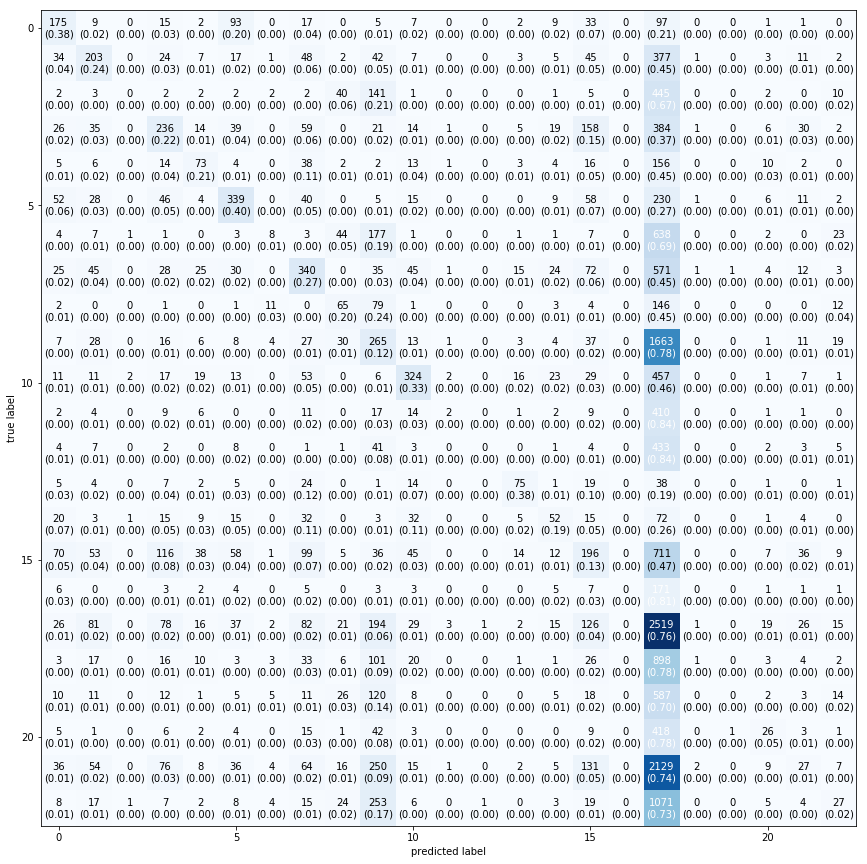

In [54]:
fig, ax = plot_confusion_matrix(conf_mat=conf_matr, figsize=(15,15), show_normed=True)


 ## random baseline

In [48]:
edu_df['rand'] = np.random.rand(77406,1)
edu_df['rand']

0        0.127375
1        0.130881
2        0.449216
3        0.742403
4        0.271605
5        0.189432
6        0.464317
7        0.733814
8        0.815696
9        0.630849
10       0.293359
11       0.229816
12       0.792406
13       0.899447
14       0.516758
15       0.931104
16       0.029253
17       0.610688
18       0.059967
19       0.868407
20       0.024931
21       0.274752
22       0.867888
23       0.993348
24       0.713135
25       0.791433
26       0.013221
27       0.803539
28       0.900526
29       0.645398
30       0.655977
31       0.768958
32       0.724721
33       0.098719
34       0.909991
35       0.437830
36       0.724493
37       0.075870
38       0.656680
39       0.338753
40       0.744792
41       0.602668
42       0.077965
43       0.760797
44       0.335034
45       0.228970
46       0.556559
47       0.664322
48       0.048341
49       0.571515
50       0.653378
51       0.043460
52       0.907021
53       0.551100
54       0.919277
55       0

In [49]:
X_baseline = edu_df.rand

In [50]:
X_baseline = np.array(X_baseline)
X_baseline = X_baseline.reshape(-1,1)
X_baseline.shape

(77406, 1)

In [51]:
y.shape

(77406,)

In [52]:
X_train_rand, X_test_rand, y_train_rand, y_test_rand = train_test_split(X_baseline, y, test_size=0.30, random_state=22)

In [53]:
clf = tree.DecisionTreeClassifier()
clf.fit(X_train_rand, y_train_rand)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [54]:
y_pred_rand = clf.predict(X_test_rand)

In [55]:
conf_matr = confusion_matrix(y_test_rand, y_pred_rand) 
print(classification_report(y_test_rand, y_pred_rand))  

                                                precision    recall  f1-score   support

                  Architecture and Engineering       0.02      0.02      0.02       415
Arts, Design, Entertainment, Sports, and Media       0.04      0.04      0.04       857
 Building and Grounds Cleaning and Maintenance       0.03      0.03      0.03       690
             Business and Financial Operations       0.05      0.05      0.05       994
                  Community and Social Service       0.02      0.02      0.02       368
                     Computer and Mathematical       0.03      0.03      0.03       840
                   Construction and Extraction       0.04      0.04      0.04       904
              Education, Training, and Library       0.06      0.06      0.06      1327
                Farming, Fishing, and Forestry       0.03      0.03      0.03       316
          Food Preparation and Serving Related       0.11      0.11      0.11      2159
        Healthcare Practitioner

In [57]:
f1_score(y_test_rand, y_pred_rand, average='micro')

0.07152700025837568

In [58]:
accuracy_score(y_test_rand, y_pred_rand)

0.07152700025837568

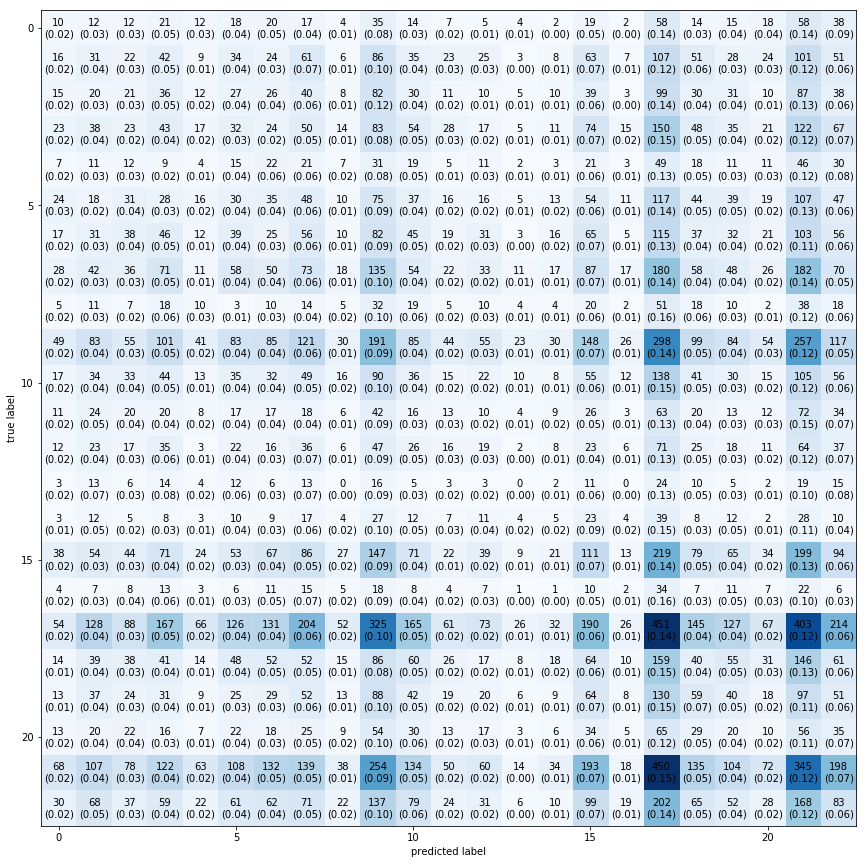

In [110]:
fig, ax = plot_confusion_matrix(conf_mat=conf_matr, figsize=(15,15), show_normed=True)

In [3]:
grid_clf

NameError: name 'grid_clf' is not defined

In [2]:
#auc

y_pred_proba = grid_clf.best_estimator_.predict_proba(X_test)
print('test auc {}:'.format( roc_auc_score(y_test, y_pred_proba[:,1], average='micro')))

fpr, tpr, threshold = roc_curve(y_test, y_pred_proba[:,1])
roc_auc = auc(fpr, tpr)

plt.title('Receiver Operating Characteristic, Computer Occupations')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--') #baseline
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

NameError: name 'grid_clf' is not defined